In [ ]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import json
import scvi
import seaborn as sns
import matplotlib.cm as cm


from utils import preprocessing

TISSUE = "Striatum"

ADATA = "/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/original_data/NucSeq_all_QCed_labelled_zoned.h5ad"

SAMPLE_VARIABLE = "donor_id"

SAVE_PATH = F"/home/gdallagl/myworkdir/data/XDP/NucSec/DEG/{TISSUE}/NucSeq_{TISSUE}_curated_labelels_for_deg.h5ad"

# Process one tissue at a time

In [2]:
adata = sc.read_h5ad(ADATA, backed="r")

# Prepare adata
adata = adata[
            (adata.obs["tissue"] == TISSUE) 
        ].to_memory().copy()
print(adata)


AnnData object with n_obs × n_vars = 231080 × 38601
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'barcode', 'bcl', 'rna_index', 'library', 'library__barcode', 'frac_mito', 'mol_info_nUMI', 'mol_info_nRead', 'frac_intronic', 'donor_id', 'vireo_prob_max', 'vireo_prob_doublet', 'vireo_n_vars', 'vireo_best_singlet', 'vireo_best_doublet', 'vireo_doublet_logLikRatio', 'dropsift_frac_contamination', 'dropsift_training_label_is_cell', 'dropsift_empty_gene_module_score', 'dropsift_is_cell', 'dropsift_is_cell_prob', 'cell_class', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'tissue', 'broad_original_cell_type', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Neighborhood_correlation_coefficient', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Class_correlation_coefficient', 'Subclass_label', 'Subclass_name'

In [3]:
def preprocess_common_pipeline(adata, umap_name="", leiden_name="", resolutions=[0.1, 0.5, 0.07, 1.0, 2.0], integrate_with_harmony=False, integrate_with_scvi=False, batch_key=None, categorical_covariate_keys=None):

    SEED =42
    
    adata.X = adata.layers["counts"].copy()
    sc.pp.normalize_total(adata, target_sum=1e4, inplace=True)
    sc.pp.log1p(adata)
    adata.layers["log1p_norm"] = adata.X.copy()

    # Cehck that all abtcjes have enight cells, otheriw use usail hvg method
    try:
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", 
                                     layer="counts", batch_key=batch_key)
        print(f"HVG computed with batch_key='{batch_key}'")
    except ValueError as e:
        print(f"WARNING: HVG with batch_key failed ({e}), retrying without batch_key")
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", 
                                     layer="counts", batch_key=None)

    if integrate_with_scvi:
        import scvi
        # Train scVI
        adata_hvg = adata[:, adata.var.highly_variable].copy()  # temp copy, HVG only
        scvi.model.SCVI.setup_anndata(adata_hvg, layer="counts", batch_key=batch_key, categorical_covariate_keys=categorical_covariate_keys)
        model = scvi.model.SCVI(adata_hvg, n_layers=2, n_latent=30)
        model.train(batch_size=512, max_epochs=50)# datasplitter_kwargs={'num_workers': 16})

        loss_key = "elbo_train" if "elbo_train" in model.history else "train_loss_epoch"
        plt.plot(model.history[loss_key]); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.show()

        adata.obsm["X_scvi"] = model.get_latent_representation()
        sc.pp.neighbors(adata, use_rep="X_scvi", random_state=SEED)
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED)

    elif integrate_with_harmony:
        import harmonypy
        if batch_key is None:
            raise ValueError("batch_key must be provided for Harmony integration.")
        sc.pp.scale(adata, max_value=10)
        sc.tl.pca(adata, svd_solver='arpack', n_comps=50, random_state=SEED)
        # Run Harmony on the PCA embedding
        ho = harmonypy.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=batch_key, max_iter_harmony=30)
        adata.obsm["X_pca_harmony"] = ho.Z_corr
        sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_pcs=30, random_state=SEED)
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED)
        
    else:
        sc.pp.scale(adata, max_value=10) #z-score normalization
        sc.tl.pca(adata, svd_solver='arpack', n_comps=50, random_state=SEED)
        sc.pp.neighbors(adata, use_rep='X_pca', n_pcs=30, random_state=SEED) # from X_pca
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED) # uese neighbors

    for r in resolutions:
        sc.tl.leiden(adata, resolution=r, key_added=f"leiden_{r}{leiden_name}", flavor="igraph", n_iterations=2, random_state=SEED) # use neighbors
    leiden_cluster_names = [f"leiden_{r}{leiden_name}" for r in resolutions]
    return leiden_cluster_names

def which_clusters_are_split(adata, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL, CLEAN_THRESHOLD = 90):

    ct_per_cluster = (
        adata.obs
        .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])
        .size() # eaw counts
        .unstack(fill_value=0) 
    )
    ct_per_cluster_pct = ct_per_cluster.div(ct_per_cluster.sum(axis=1), axis=0) * 100 # cal pct

    fig, ax = plt.subplots(figsize=(12, 6))
    sns.heatmap(ct_per_cluster_pct, annot=True, fmt=".0f", cmap="Blues",
                cbar_kws={"label": "% of cluster"}, ax=ax)
    ax.set_title(f"{CLUSTERS_GROUP_ALL_CELLS_COL} x {MMC_ANNOTATION_LEVEL}  (% of cluster)")
    ax.set_xlabel("MMC label"); ax.set_ylabel("Cluster")
    plt.tight_layout(); plt.show()

    # for each clutser applu ruels to say if it ok or need ot investigate
    #CLEAN_THRESHOLD = 90   # % to call a cluster "clean"

    cluster_status = {}
    for cluster, row in ct_per_cluster_pct.iterrows():
        top_label  = row.idxmax()
        top_pct    = row.max()
        if top_pct >= CLEAN_THRESHOLD:
            status = "clean"
        else:
            status = "INVESTIGATE"   # mixed → check marker genes manually
        cluster_status[cluster] = {"top_label": top_label, "top_pct": top_pct, "status": status}

    cluster_status_df = pd.DataFrame(cluster_status).T
    display(cluster_status_df)

In [4]:
# Preprocess
leiden_cluster_names = preprocess_common_pipeline(adata, leiden_name="_all_cells", integrate_with_harmony=True, batch_key="library")

HVG computed with batch_key='library'


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-02-20 17:34:36,432 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-20 17:34:36,433 - harmonypy - INFO -   Parameters:
2026-02-20 17:34:36,434 - harmonypy - INFO -     max_iter_harmony: 30
2026-02-20 17:34:36,434 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-20 17:34:36,435 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-20 17:34:36,436 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-20 17:34:36,436 - harmonypy - INFO -     nclust: 100
2026-02-20 17:34:36,438 - harmonypy - INFO -     block_size: 0.05
2026-02-20 17:34:36,439 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-20 17:34:36,440 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-02-20 17:34:36,440 - harmonypy - INFO -     sigma:

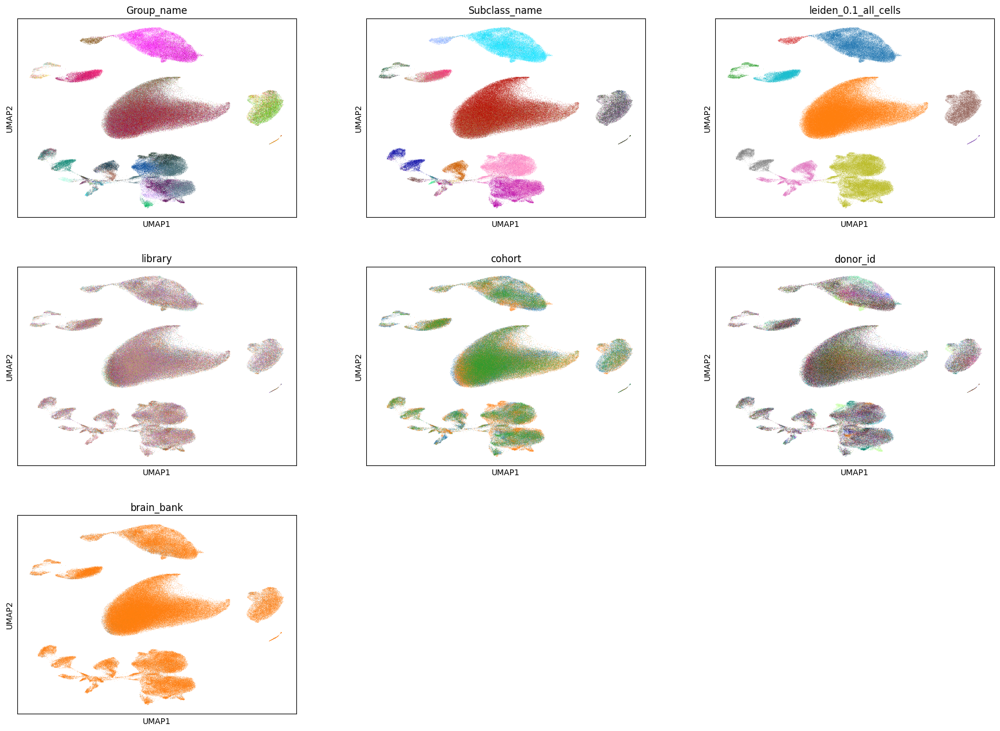

In [5]:
sc.pl.umap(adata, color=["Group_name", "Subclass_name", leiden_cluster_names[0], "library", "cohort", "donor_id", "brain_bank"], ncols=3, legend_loc=None)

# General

1. select a broad cell type (ex glia)
2. find the clusters (using all cells) that overlap with the cts that belogn to that broad group
3. reproess and cluster the subset of these cells
4. for new unsueprvised clusters, chek if the mmc labels are homogeneous inside
5. for the mmc ct, chekc thue displitrubuton in the new clusters (no split)

If a cluster has mixed/messy MapMyCells labels → annotate it manually

If a MapMyCells label splits across multiple clusters → investigate further

If a cluster is 90%+ one label with a few minority cells → decide carefully how to assign those minority cells (don't automatically trust their MapMyCells label)

In [4]:
subclass_cell_types_mapping = {
    "MSN": [
        "STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN",
    ],
    "non_MSN_neuron": [
        "ACx MEIS2 GABA", "CN Cholinergic GABA", "CN GABA-Glut",
        "CN LAMP5-CXCL14 GABA", "CN LAMP5-LHX6 GABA", "CN LHX8 GABA",
        "CN MEIS2 GABA", "CN ONECUT1 GABA", "CN ST18 GABA", "CN VIP GABA",
        "F GABA", "F Glut", "F M GATA3 GABA", "F M Glut", "M Dopa",
        "OT Granular GABA", "SN PAX7 GABA", "STR SST-CHODL GABA","STR RSPO2 GABA"
    ],
    "glia": [
        "Astrocyte", "COP", "Ependymal", "Oligodendrocyte", "OPC"
    ],
    "vascular": [
        "Endo", "Pericyte", "SMC", "VLMC"
    ],
    "immune": [
        "Lymphocyte", "Macrophage", "Microglia"
    ],
}

# reverse map: cell type → broad category (useful for adata.obs)
celltype_to_broad = {
    cell: broad
    for broad, cells in subclass_cell_types_mapping.items()
    for cell in cells
}

# Glia

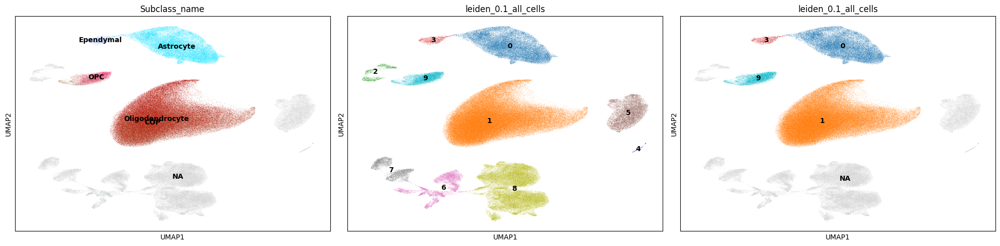

In [8]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["0", "1", "3", "9"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["glia"]
NAME="_glia"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

HVG computed with batch_key='library'


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-02-20 17:49:15,484 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-20 17:49:15,485 - harmonypy - INFO -   Parameters:
2026-02-20 17:49:15,485 - harmonypy - INFO -     max_iter_harmony: 30
2026-02-20 17:49:15,486 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-20 17:49:15,486 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-20 17:49:15,487 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-20 17:49:15,487 - harmonypy - INFO -     nclust: 100
2026-02-20 17:49:15,487 - harmonypy - INFO -     block_size: 0.05
2026-02-20 17:49:15,488 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-20 17:49:15,489 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-02-20 17:49:15,489 - harmonypy - INFO -     sigma:

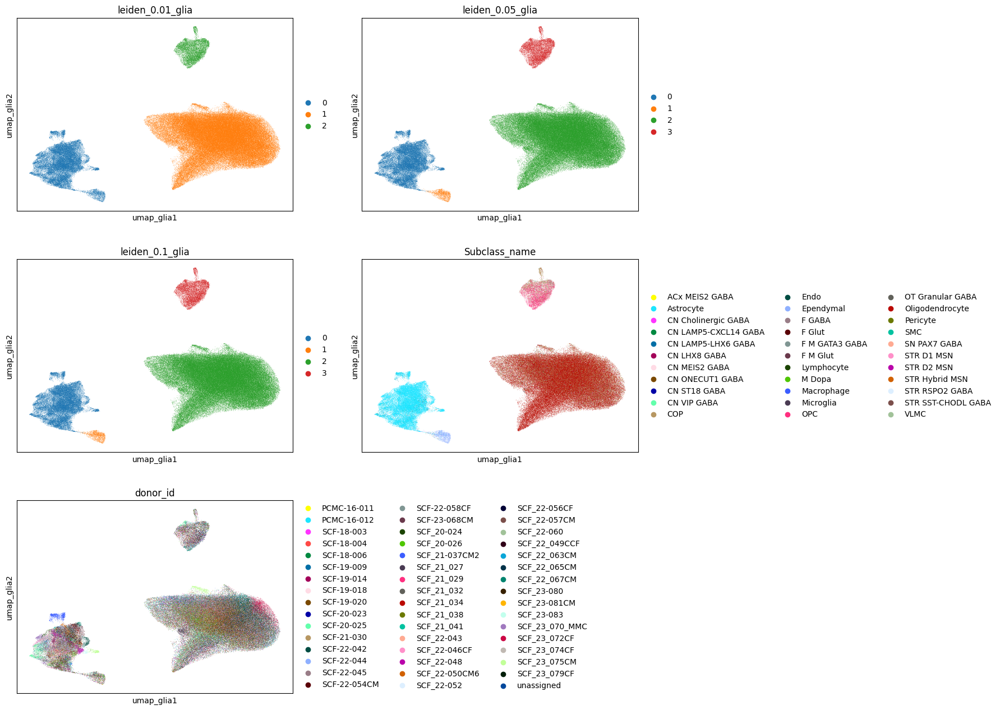

In [9]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.01, 0.05, 0.1], integrate_with_harmony=True, batch_key="library")

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

/tmp/ipykernel_1579249/2182193506.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


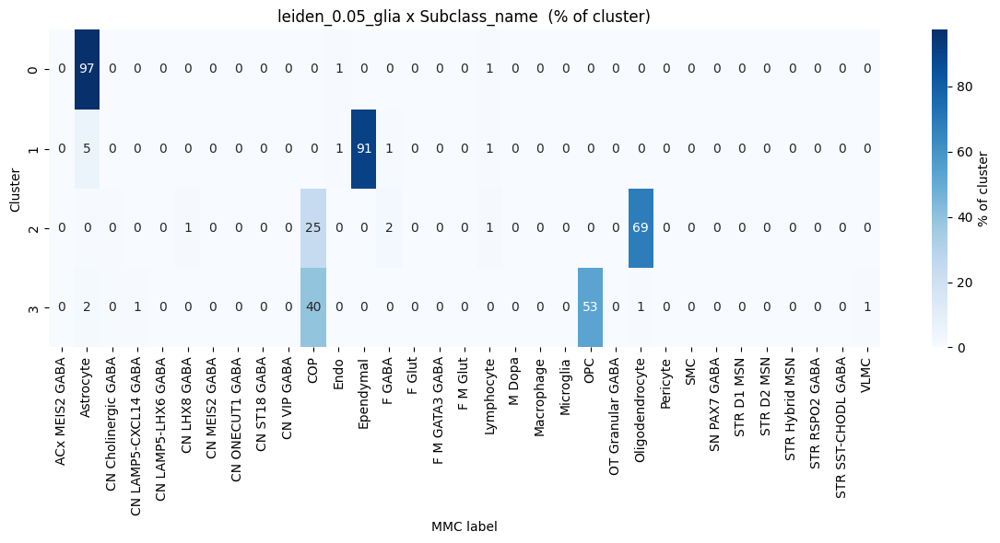

,top_label,top_pct,status
0,Astrocyte,97.3916,clean
1,Ependymal,91.281019,clean
2,Oligodendrocyte,68.807042,INVESTIGATE
3,OPC,53.439608,INVESTIGATE


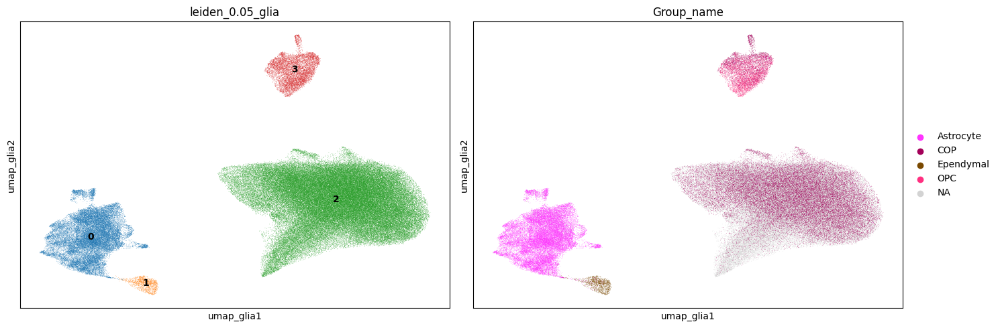

In [ ]:
###########
### Cluster analysys (see if in unsupervosed clusters the cell types by mmc are coherent)
###########
CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.05{NAME}"

which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data", ax=axes[0], show=False)
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="Group_name", groups=GROUP_LABELS, legend_loc="right margin", ax=axes[1], show=False)
plt.tight_layout()
plt.show()

### Final decision

Suppress COP.

/tmp/ipykernel_1579249/4064712390.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['Astrocyte', 'Astrocyte', 'Astrocyte', 'Astrocyte', 'Astrocyte', ..., 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte']
Length: 162425
Categories (4, object): ['Astrocyte', 'Ependymal', 'Oligodendrocyte', 'OPC']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


ct_for_deg
Oligodendrocyte    123374
Astrocyte           29405
OPC                  8155
Ependymal            1491
Name: count, dtype: int64


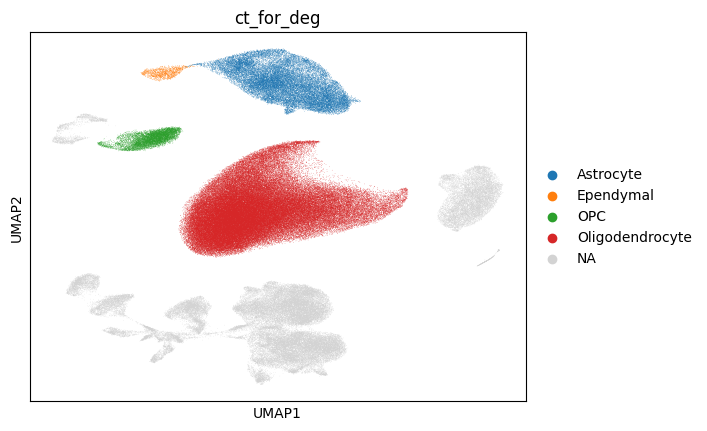

In [17]:

# map clusters to yout ct
mapping_dict = {
    "0": "Astrocyte",
    "1": "Ependymal",
    "2": "Oligodendrocyte", 
    "3": "OPC"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict)

# Add to orignla ct
if "ct_for_deg" not in adata.obs.columns:
    adata.obs["ct_for_deg"] = np.nan
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")

In [18]:
del adata_nn

# Vascular

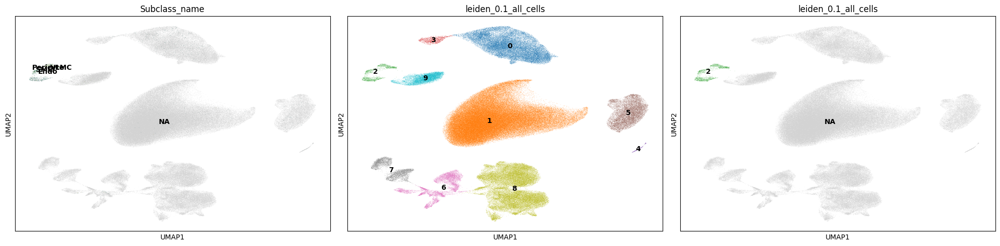

In [19]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["2"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["vascular"]
NAME="_vascular"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-02-20 18:00:43,981 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-20 18:00:43,983 - harmonypy - INFO -   Parameters:
2026-02-20 18:00:43,984 - harmonypy - INFO -     max_iter_harmony: 30
2026-02-20 18:00:43,984 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-20 18:00:43,985 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-20 18:00:43,986 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-20 18:00:43,987 - harmonypy - INFO -     nclust: 56
2026-02-20 18:00:43,988 - harmonypy - INFO -     block_size: 0.05
2026-02-20 18:00:43,989 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-20 18:00:43,990 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-02-20 18:00:43,991 - harmonypy - INFO -     sigma: 

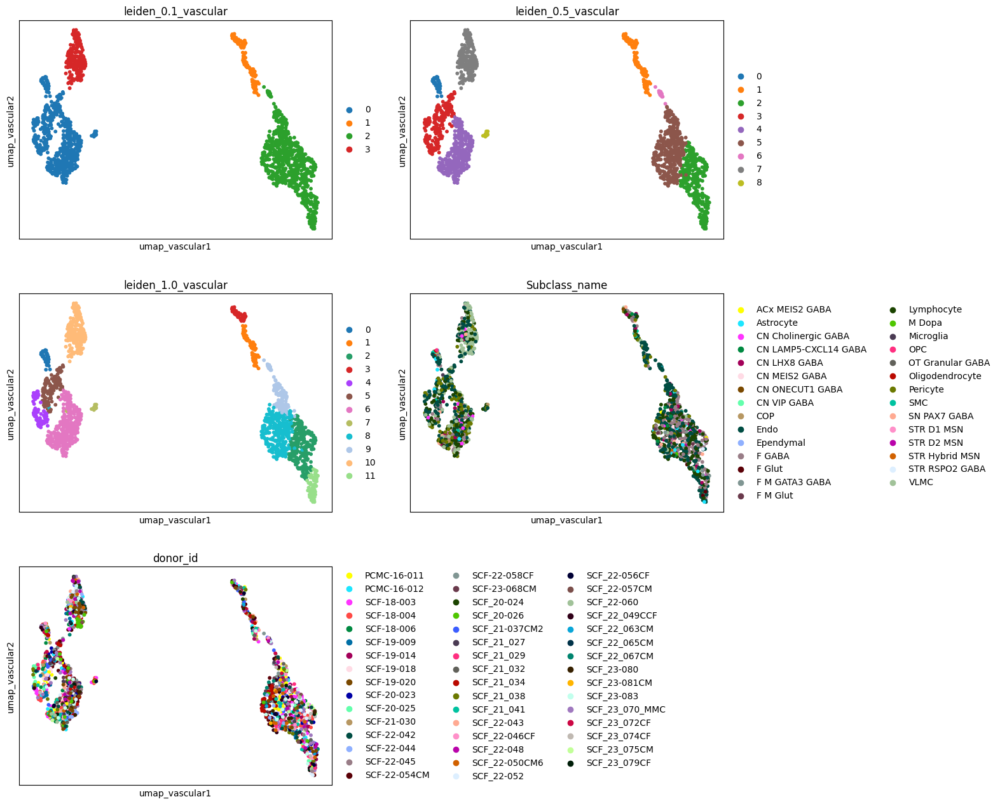

In [20]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.5, 1.0], integrate_with_harmony=True, batch_key="library")

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

/tmp/ipykernel_1579249/2182193506.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


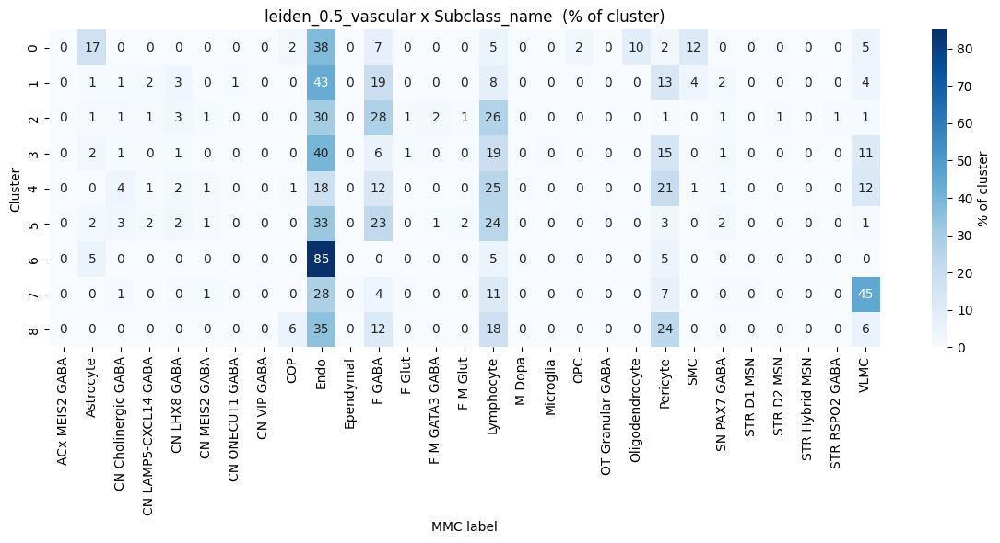

,top_label,top_pct,status
0,Endo,38.095238,INVESTIGATE
1,Endo,43.410853,INVESTIGATE
2,Endo,30.218069,INVESTIGATE
3,Endo,40.09434,INVESTIGATE
4,Lymphocyte,25.227964,INVESTIGATE
5,Endo,32.898172,INVESTIGATE
6,Endo,85.0,INVESTIGATE
7,VLMC,45.414847,INVESTIGATE
8,Endo,35.294118,INVESTIGATE


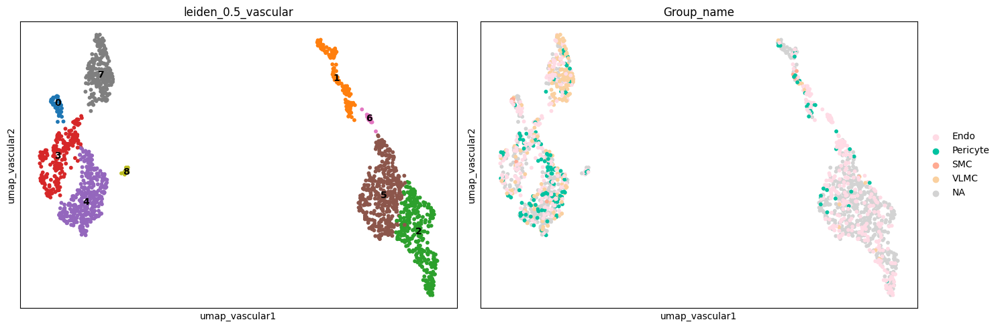

In [ ]:
###########
### Cluster analysys (see if in unsupervosed clusters the cell types by mmc are coherent)
###########
CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.5{NAME}"

which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data", ax=axes[0], show=False)
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="Subclass_name", groups=GROUP_LABELS, legend_loc="right margin", ax=axes[1], show=False)
plt.tight_layout()
plt.show()

### Final decision

ct_for_deg
Oligodendrocyte    123374
Astrocyte           29405
OPC                  8155
Vascular             1682
Ependymal            1491
Name: count, dtype: int64


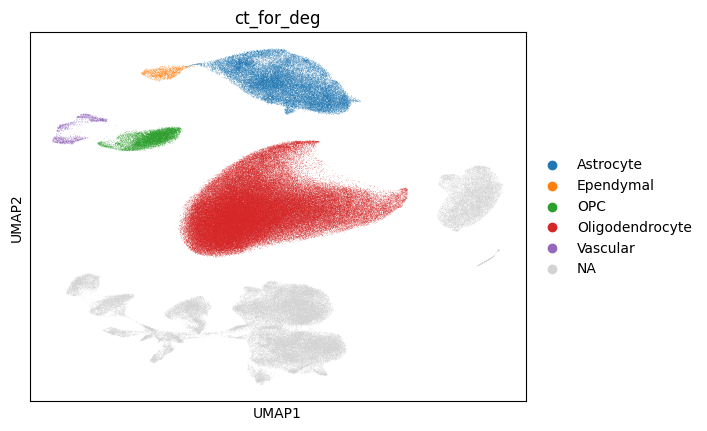

In [ ]:
adata_nn.obs["tmp_label"] = "Vascular"
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align

print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")

# Immune

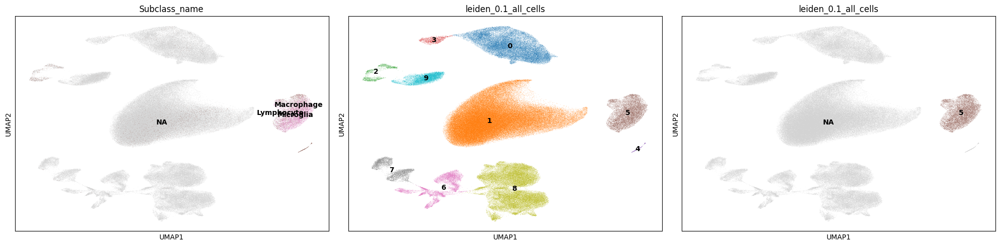

In [35]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["5"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["immune"]
NAME="_immune"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data", palette="tab20")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

HVG computed with batch_key='library'


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-02-20 18:02:23,960 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-20 18:02:23,961 - harmonypy - INFO -   Parameters:
2026-02-20 18:02:23,962 - harmonypy - INFO -     max_iter_harmony: 30
2026-02-20 18:02:23,963 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-20 18:02:23,963 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-20 18:02:23,964 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-20 18:02:23,965 - harmonypy - INFO -     nclust: 100
2026-02-20 18:02:23,966 - harmonypy - INFO -     block_size: 0.05
2026-02-20 18:02:23,967 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-20 18:02:23,968 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-02-20 18:02:23,969 - harmonypy - INFO -     sigma:

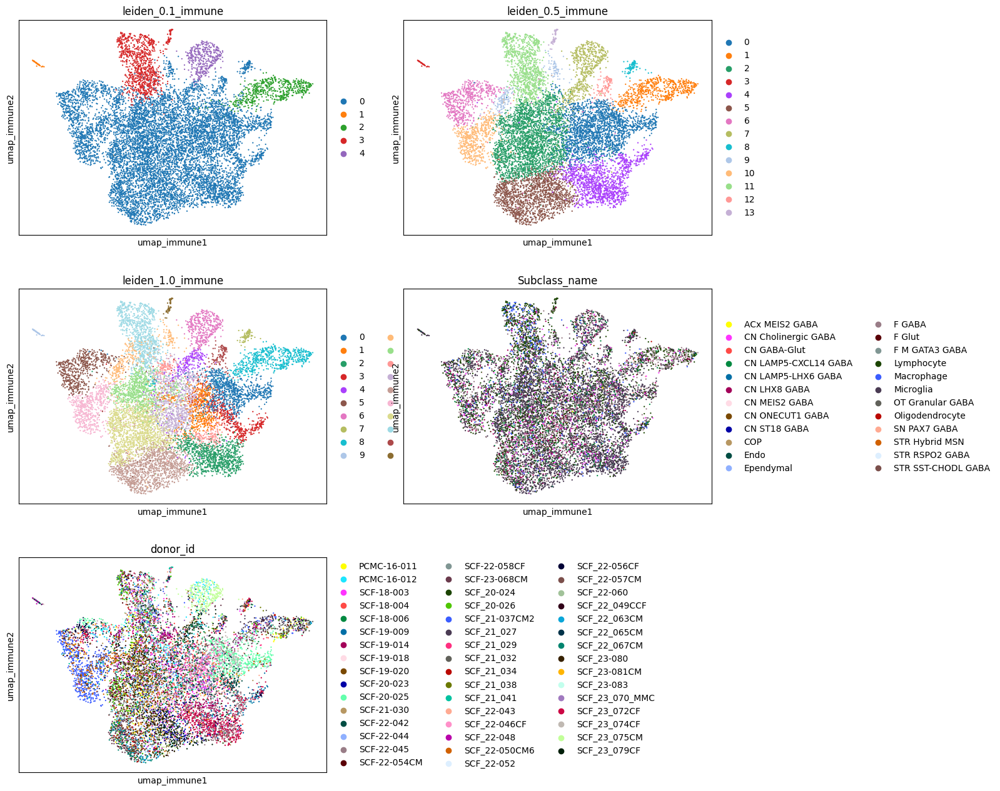

In [24]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.5, 1.0], integrate_with_harmony=True, batch_key="library")

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

/tmp/ipykernel_1579249/2182193506.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


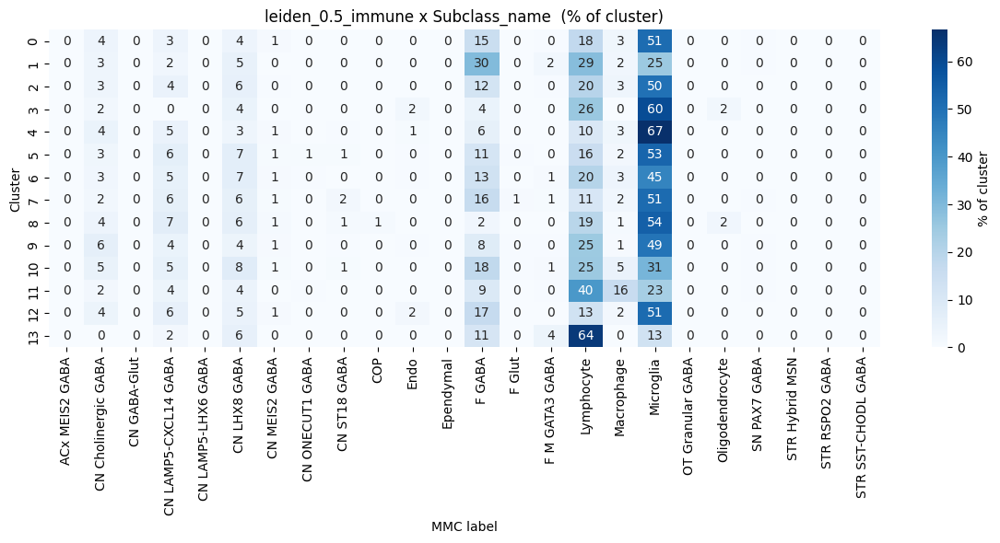

,top_label,top_pct,status
0,Microglia,51.163919,INVESTIGATE
1,F GABA,29.537954,INVESTIGATE
2,Microglia,49.825107,INVESTIGATE
3,Microglia,59.574468,INVESTIGATE
4,Microglia,66.6162,INVESTIGATE
5,Microglia,52.837573,INVESTIGATE
6,Microglia,45.189003,INVESTIGATE
7,Microglia,51.324503,INVESTIGATE
8,Microglia,54.216867,INVESTIGATE
9,Microglia,49.074074,INVESTIGATE


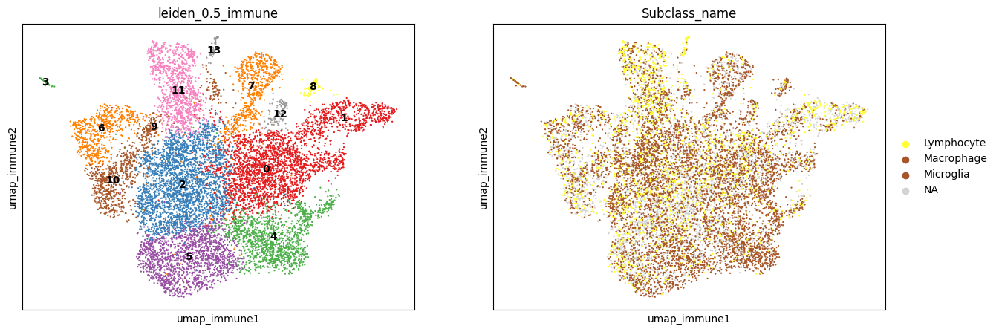

<Figure size 640x480 with 0 Axes>

In [49]:
###########
### Cluster analysys (see if in unsupervosed clusters the cell types by mmc are coherent)
###########
CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.5{NAME}"

which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data", ax=axes[0], show=False)
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="Subclass_name", groups=GROUP_LABELS, legend_loc="right margin", ax=axes[1])
plt.tight_layout()
plt.show()

### Final decision leave all as microglia

ct_for_deg
Oligodendrocyte    123374
Astrocyte           29405
Microglia           11354
OPC                  8155
Vascular             1682
Ependymal            1491
Name: count, dtype: int64


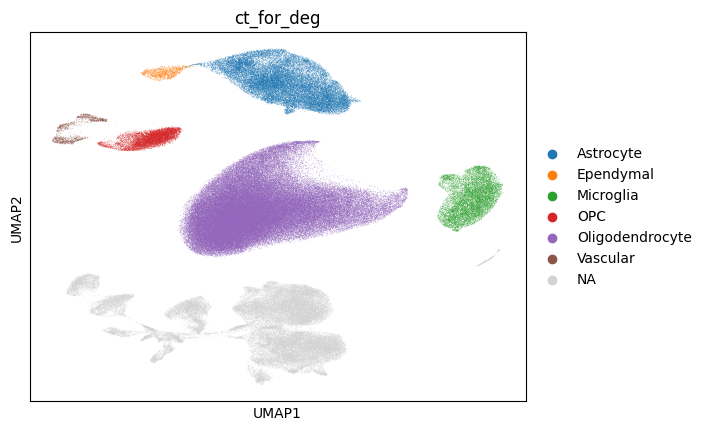

In [50]:
adata_nn.obs["tmp_label"] = "Microglia"
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align

print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")

# Neurons

In [ ]:
# r=0.1
# #sc.tl.leiden(adata, resolution=r, key_added=f"leiden_{r}_all_cells", flavor="igraph", n_iterations=2) # use neighbors
# CLUSTERS_ALL_CELLS_COL = f"leiden_{r}_all_cells"
# sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL,legend_loc="on data")


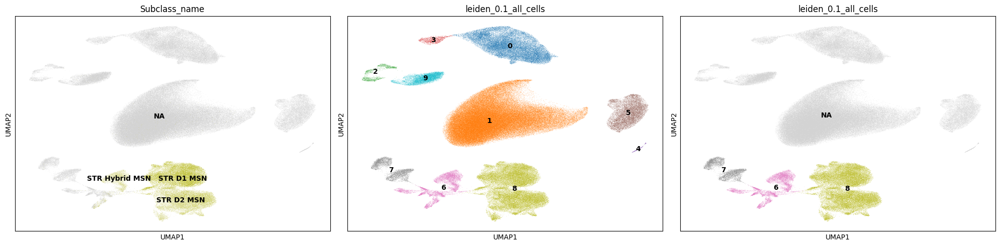

In [6]:
CLUSTERS_ALL_CELLS_COL = f"leiden_0.1_all_cells" # NEED SMALLER RESOLUTION
CLUSTERS_GROUP_ALL_CELLS =  ["6", "7", "8"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["MSN"]
NAME="_MSN"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

In [10]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.3, 0.5], integrate_with_harmony=True, batch_key=SAMPLE_VARIABLE)

# map Group-name to broader categories
mapping_msn = {
    "STRd D1 Matrix MSN": "Matrix",
    "STRd D2 Matrix MSN": "Matrix",
    "STRv D1 MSN": "Matrix",
    "STRv D2 MSN": "Matrix",

    "STRd D2 Striosome MSN": "Patch",
    "STRd D1 Striosome MSN": "Patch",

    "STRd D2 StrioMat Hybrid MSN": "eMSN_StrioMat",
    "STR D1D2 Hybrid MSN": "eMSN_D1D2",
    "STRv D1 NUDAP MSN": "eMSN_NUDAP"
  }
adata_nn.obs["MSN_type"] = adata_nn.obs["Group_name"].map(mapping_msn)

HVG computed with batch_key='donor_id'


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-02-20 18:45:45,095 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-02-20 18:45:45,096 - harmonypy - INFO -   Parameters:
2026-02-20 18:45:45,096 - harmonypy - INFO -     max_iter_harmony: 30
2026-02-20 18:45:45,097 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-20 18:45:45,097 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-20 18:45:45,098 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-20 18:45:45,098 - harmonypy - INFO -     nclust: 100
2026-02-20 18:45:45,099 - harmonypy - INFO -     block_size: 0.05
2026-02-20 18:45:45,099 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-20 18:45:45,100 - harmonypy - INFO -     theta: [2. 2. 2. 2

In [5]:
#adata.write_h5ad("/home/gdallagl/myworkdir/XDP/data/_tmp/nucseq_ct.h5ad")
#adata = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/_tmp/nucseq_ct.h5ad")

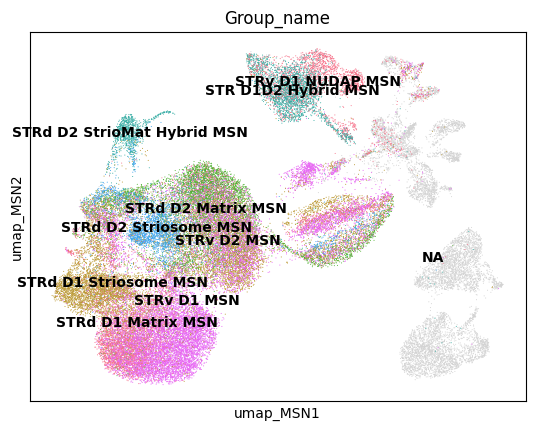

Assure that adata.var.index has same gene name of makers...


  0%|          | 0/1 [00:00<?, ?it/s]

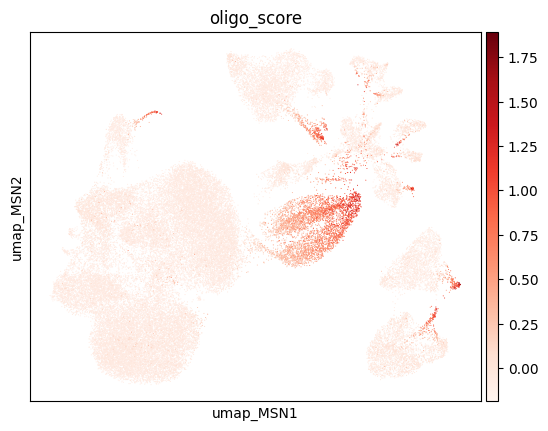

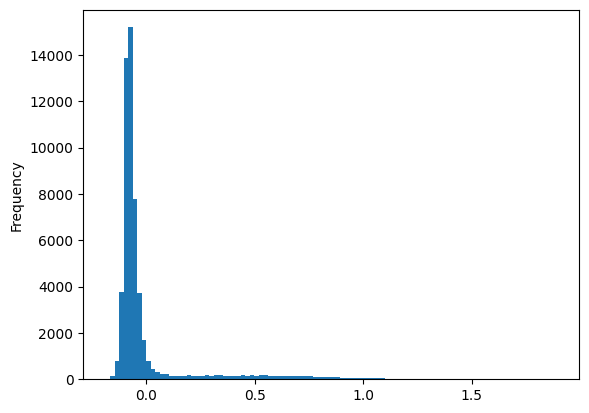

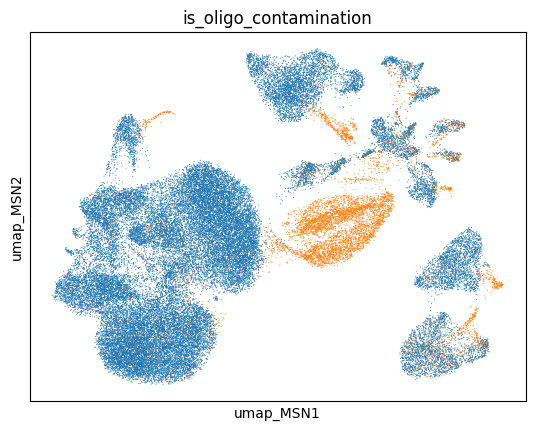

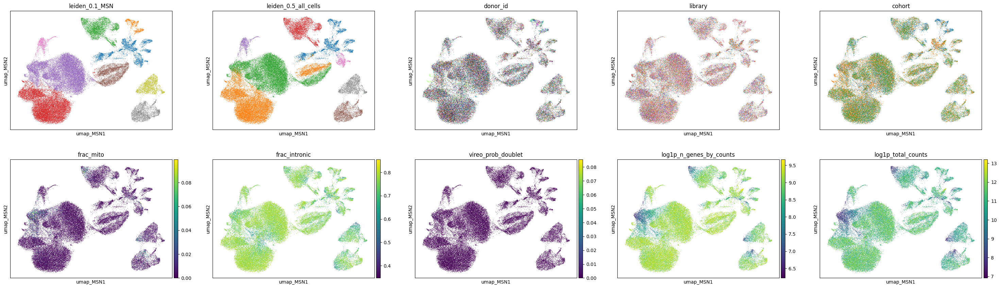

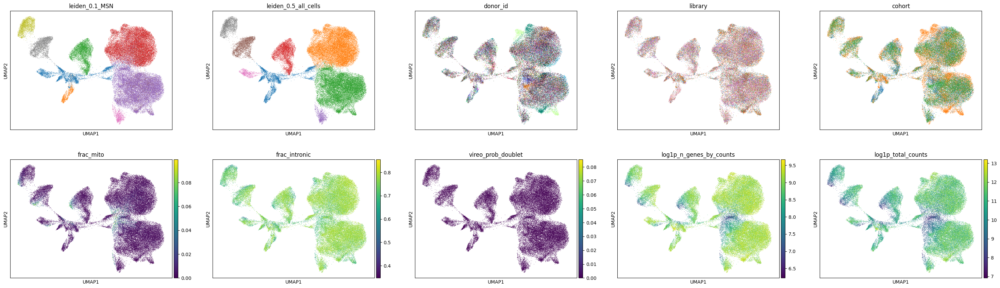

In [11]:
# Invstrigate why MSN spit in differt clusters

# plto prbel sèlitting
#del adata_nn.uns["Group_name_colors"]
sc.pl.embedding(adata_nn, color="Group_name", basis="umap_MSN", palette=sns.color_palette("husl"), groups=mapping_msn.keys(), legend_loc="on data")

# Check if they are ooligos contamiantion
dict_oligo={"oligo": ["MBP", "SOX10", 'TF', 'PLP1', 'MOBP', 'TMEM144', "MOG", "MAG", "OPALIN", "ABCA8"]}
col_oligo_score = preprocessing.calculate_and_plot_markers(adata_nn, dict_oligo, ncol=3, layer="log1p_norm", color_map="Reds", umap_name="umap_MSN")

adata_nn.obs["is_oligo_contamination"] = (adata_nn.obs[col_oligo_score[0]] >= 0).fillna(0).astype(bool)
adata_nn.obs[col_oligo_score[0]].plot(kind="hist", bins=100)
sc.pl.embedding(adata_nn, color="is_oligo_contamination", basis="umap_MSN", ncols=5, legend_loc=None)

toplot = ["leiden_0.1_MSN", "leiden_0.5_all_cells", 
          SAMPLE_VARIABLE, "library", "cohort", 
          "frac_mito", "frac_intronic", "vireo_prob_doublet", "log1p_n_genes_by_counts", "log1p_total_counts"]
sc.pl.embedding(adata_nn, color=toplot, basis="umap_MSN", ncols=5, legend_loc=None)
sc.pl.embedding(adata_nn, color=toplot, basis="umap", ncols=5, legend_loc=None)

/tmp/ipykernel_1584312/2182193506.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


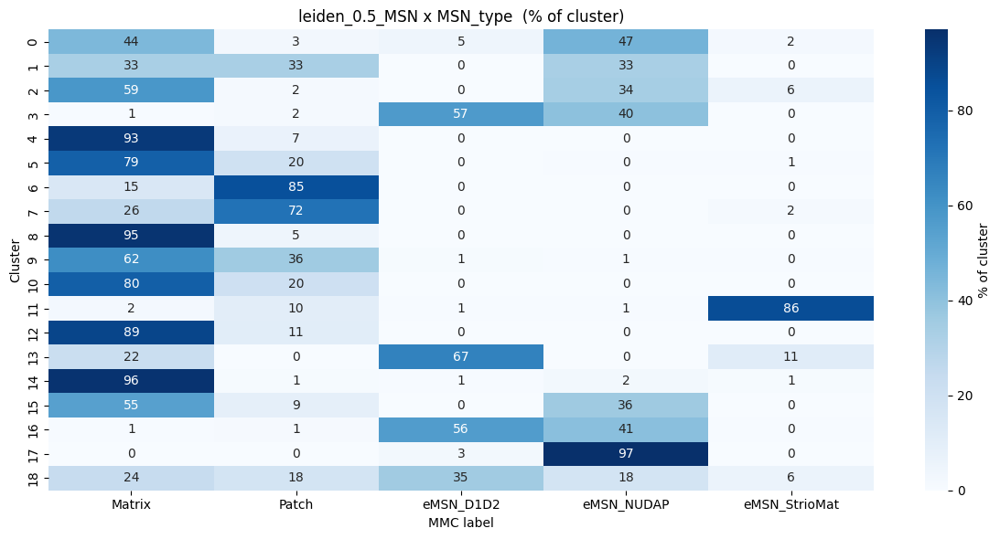

,top_label,top_pct,status
0,eMSN_NUDAP,46.511628,INVESTIGATE
1,Matrix,33.333333,INVESTIGATE
2,Matrix,58.528428,INVESTIGATE
3,eMSN_D1D2,56.92517,INVESTIGATE
4,Matrix,93.372404,clean
5,Matrix,79.095023,INVESTIGATE
6,Patch,85.111282,INVESTIGATE
7,Patch,72.31405,INVESTIGATE
8,Matrix,95.265299,clean
9,Matrix,62.091327,INVESTIGATE


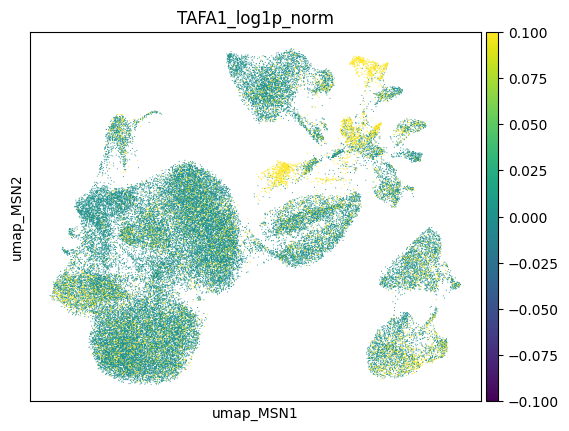

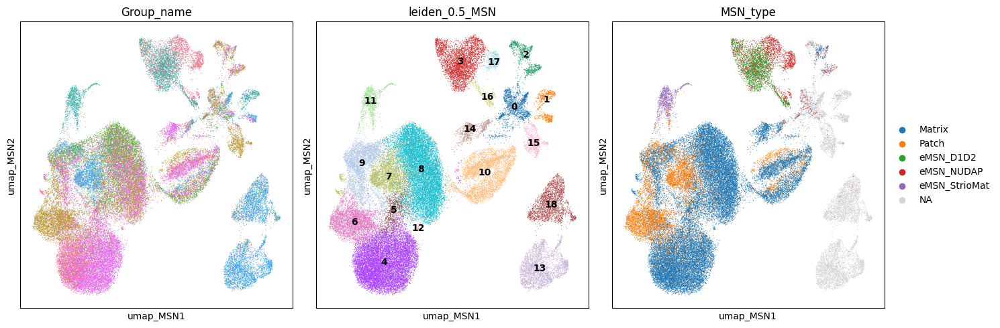

In [12]:
CLUSTERS_GROUP_ALL_CELLS_COL=f"leiden_0.5_MSN"
which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, "MSN_type", CLEAN_THRESHOLD = 90)

idx_tafa1 = adata_nn.var.index.get_indexer(adata_nn.var.query("gene_symbol == 'TAFA1'").index)
adata_nn.obs["TAFA1_log1p_norm"] = adata_nn.layers["log1p_norm"][:, idx_tafa1].toarray().ravel()
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=["TAFA1_log1p_norm"], ncols=2, vmax=np.quantile(adata_nn.obs["TAFA1_log1p_norm"].values, 0.2))

legend_locs = [None, "on data", "right margin"]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, col, loc in zip(axes, ["Group_name", CLUSTERS_GROUP_ALL_CELLS_COL, "MSN_type"], legend_locs):
    sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=col, 
                    legend_loc=loc, ax=ax, show=False)
plt.tight_layout()
plt.show()

### Final decision

usual splot by unsueprvised clusters

Give spscific label --> all rest in non_MSN

but flag oligo contamination

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
Matrix                   23652
Microglia                11354
-Oligo_contamination      8248
OPC                       8155
Neuron_non_MSN            7202
Patch                     6608
-low_quality_MSN          3696
eMSN_D1D2                 3665
Vascular                  1682
Ependymal                 1491
eMSN_StrioMat              879
-TAFA1                     794
eMSN_NUDAP                 459
Name: count, dtype: int64


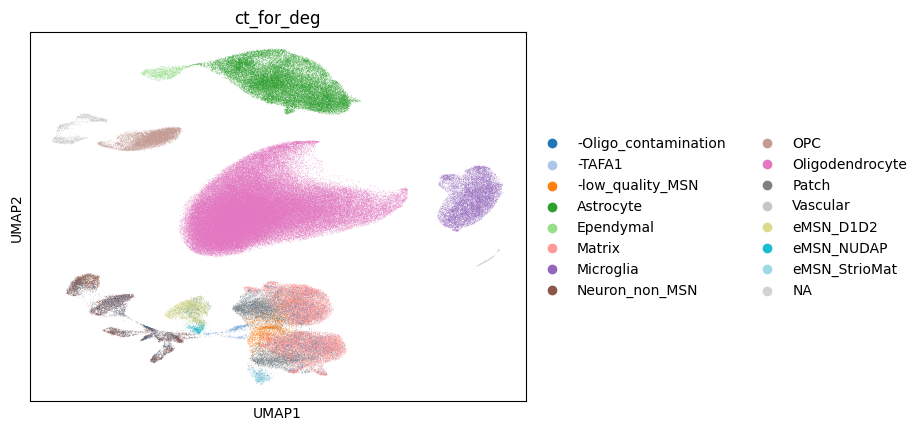

In [ ]:

# map clusters to yout ct
mapping_dict = {
    "6": "Patch",
    "7": "Patch",

    "4": "Matrix",
    "5": "Matrix",
    "8": "Matrix",
    "12": "Matrix",

    "11": "eMSN_StrioMat",
    "17": "eMSN_NUDAP",
    "3": "eMSN_D1D2",

    "14": "-TAFA1",

    "10": "-Oligo_contamination", 
    "16": "-Oligo_contamination", 
    "9": "-low_quality_MSN"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict).fillna("Neuron_non_MSN")
adata_nn.obs.loc[adata_nn.obs["is_oligo_contamination"], "tmp_label"] = "-Oligo_contamination"


# Add to orignla ct
if "ct_for_deg" not in adata.obs.columns:
    adata.obs["ct_for_deg"] = np.nan
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg", palette="tab20")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="ct_for_deg")

In [70]:
# sc.tl.rank_genes_groups(adata_nn, groupby="leiden_0.1_MSN", 
#                          groups=["4"], reference="rest", method="wilcoxon", layer="log1p_norm")
# sc.pl.rank_genes_groups(adata_nn, groups=["4"], n_genes=30)
# result = adata_nn.uns["rank_genes_groups"]
# de_df = pd.DataFrame({
#     "gene":   result["names"]["4"],
#     "score":  result["scores"]["4"],
#     "logfc":  result["logfoldchanges"]["4"],
#     "pval":   result["pvals"]["4"],
#     "pval_adj": result["pvals_adj"]["4"],
# })

# # Filter for significant upregulated markers
# de_df_sig = de_df[de_df["pval_adj"] < 0.05].sort_values("logfc", ascending=False)

# print(de_df_sig.head(30))

# All rest

In [30]:
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].fillna("-unassigned")

# Save

In [35]:
adata.write_h5ad(SAVE_PATH)

In [2]:
adata = sc.read_h5ad(SAVE_PATH)

# Check orignal cell type distirbution

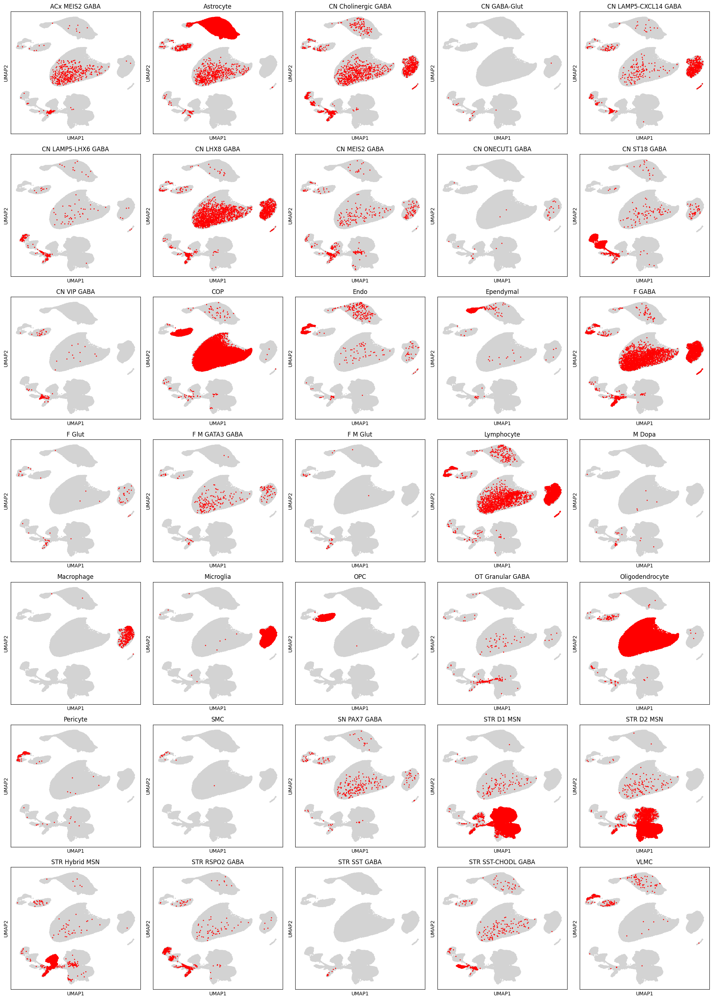

In [4]:
cts = adata.obs["Subclass_name"].cat.categories
n_cols = 5
n_rows = int(np.ceil(len(cts) / n_cols))

adata.uns["Subclass_name_colors"] = ["red"] * len(adata.obs["Subclass_name"].cat.categories)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
axes = axes.flatten()

for ax, ct in zip(axes, cts):
    sc.pl.umap(adata, color="Subclass_name", groups=[ct], ax=ax, show=False, size=20,
               title=ct, legend_loc=None, na_color="#d3d3d3")

# hide empty axes
for ax in axes[len(cts):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

# Final Checks

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
Matrix                   23652
Microglia                11354
-Oligo_contamination      8248
OPC                       8155
Neuron_non_MSN            7202
Patch                     6608
-low_quality_MSN          3696
eMSN_D1D2                 3665
Vascular                  1682
Ependymal                 1491
eMSN_StrioMat              879
-TAFA1                     794
eMSN_NUDAP                 459
-unassigned                416
Name: count, dtype: int64


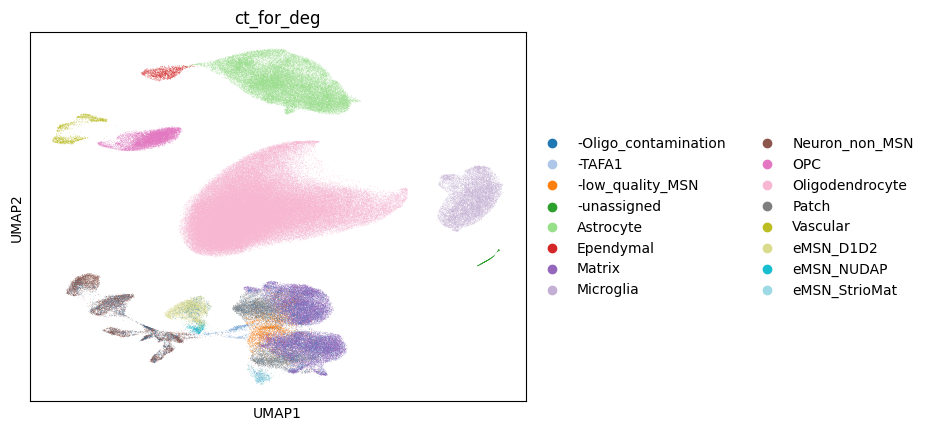

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{value_to_plot}_colors"] = colors_list


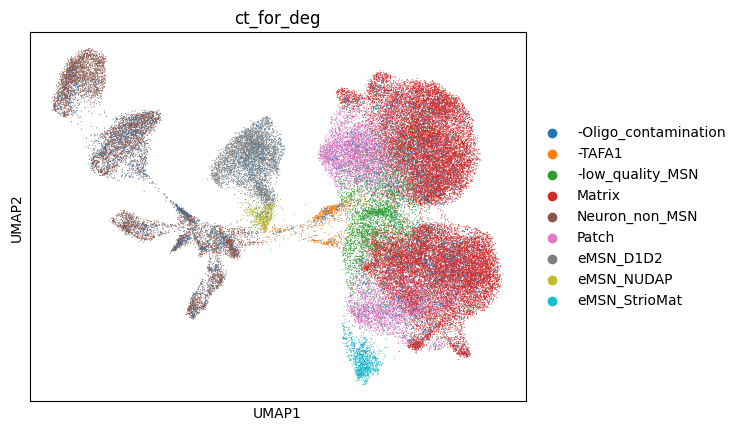

: 

In [ ]:
print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")

adata_nn = adata[adata.obs["leiden_0.1_all_cells"].isin(["6", "7", "8"])]
sc.pl.umap(adata_nn, color="ct_for_deg", palette="tab10")

Group_name
AMY-SLEA-BNST D1 GABA             177
B cells                           147
T cells                            31
LAMP5-CXCL14 GABA                  16
GPe SOX6-CTXND1 GABA               14
GPin-BF Cholinergic GABA           13
Endo                                4
Astrocyte                           2
LAMP5-LHX6 GABA                     2
BF SKOR1 Glut                       2
AMY-SLEA-BNST GABA                  2
SN EBF2 GABA                        2
GPe MEIS2-SOX6 GABA                 1
BAM                                 1
COP                                 1
VLMC                                1
GPi Shell                           0
Ependymal                           0
GPe-NDB-SI LHX6-LHX8-GBX1 GABA      0
Microglia                           0
OB Dopa-GABA                        0
OB FRMD7 GABA                       0
OPC                                 0
OT D1 ICj                           0
GPi Core                            0
ImOligo                             0
I

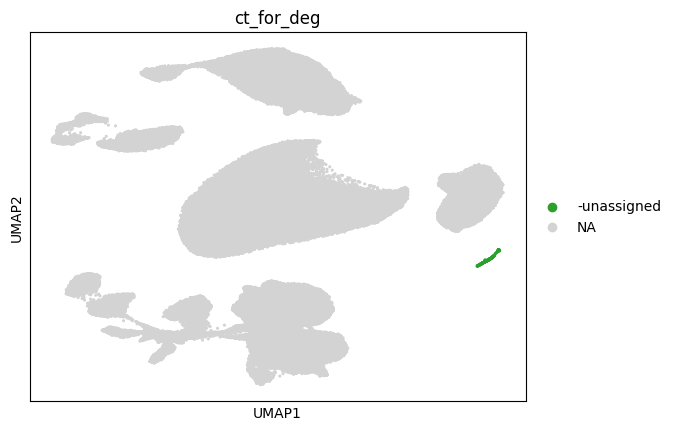

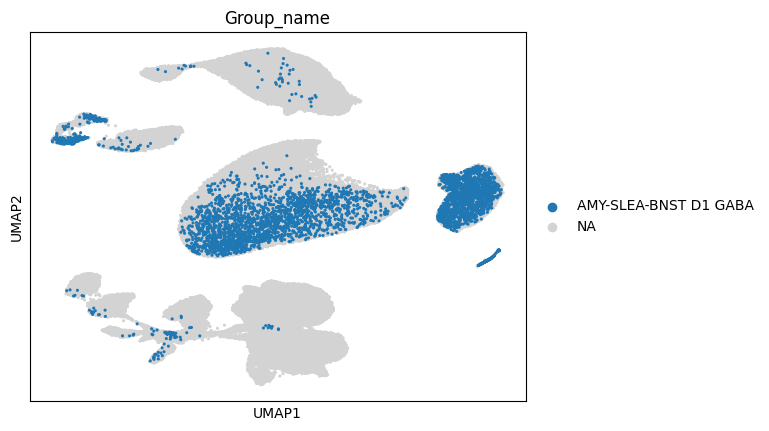

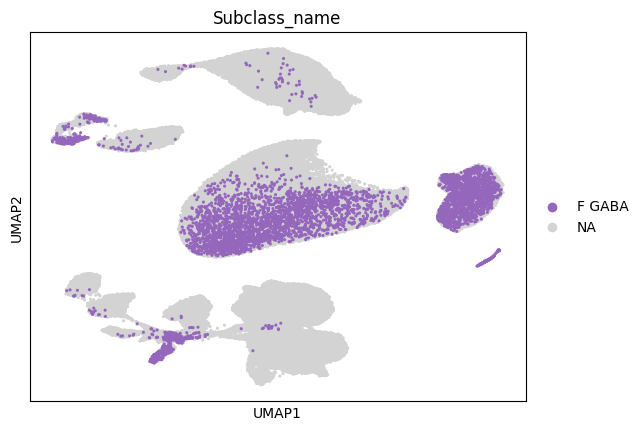

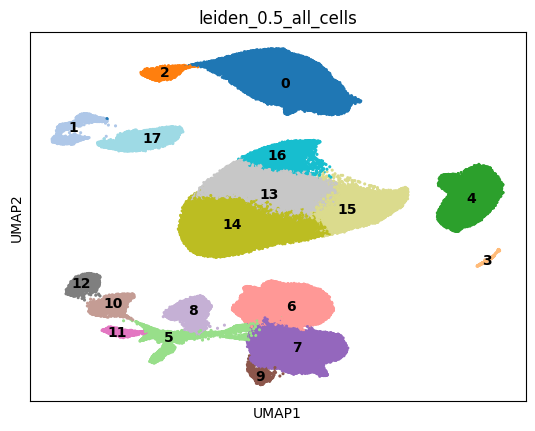

Group_name
AMY-SLEA-BNST D1 GABA             177
B cells                           147
T cells                            31
LAMP5-CXCL14 GABA                  16
GPe SOX6-CTXND1 GABA               14
GPin-BF Cholinergic GABA           13
Endo                                4
Astrocyte                           2
LAMP5-LHX6 GABA                     2
BF SKOR1 Glut                       2
AMY-SLEA-BNST GABA                  2
SN EBF2 GABA                        2
GPe MEIS2-SOX6 GABA                 1
BAM                                 1
COP                                 1
VLMC                                1
GPi Shell                           0
Ependymal                           0
GPe-NDB-SI LHX6-LHX8-GBX1 GABA      0
Microglia                           0
OB Dopa-GABA                        0
OB FRMD7 GABA                       0
OPC                                 0
OT D1 ICj                           0
GPi Core                            0
ImOligo                             0
I

In [ ]:
df = adata.obs[adata.obs["ct_for_deg"] == "-unassigned"]
print(df["Group_name"].value_counts())
sc.pl.umap(adata, color="ct_for_deg", groups=["-unassigned"], size=20, palette="tab20")

sc.pl.umap(adata, color="Group_name", groups="AMY-SLEA-BNST D1 GABA", size=20, palette="tab20")
sc.pl.umap(adata, color="Subclass_name", groups="F GABA", size=20, palette="tab20")

sc.pl.umap(adata, color="leiden_0.5_all_cells", size=20, palette="tab20", legend_loc="on data")
df = adata.obs[adata.obs["leiden_0.5_all_cells"] == "3"]
print(df["Group_name"].value_counts())